In [1]:
import os
import imghdr
import gc
import mtcnn
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt 
from os.path import join as path_join 
from PIL import Image, ImageOps, ImageFilter
import random

# Prevent GPU memory blow-ups 
# (Must run it before importing any tensorflow package)
os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'

import tensorflow as tf
import tensorflow_similarity as tfsim
from tensorflow.keras import layers
from tensorflow_similarity.layers import MetricEmbedding 
from tensorflow_similarity.losses import MultiSimilarityLoss 
from tensorflow_similarity.models import SimilarityModel
from tensorflow_similarity.visualization import viz_neigbors_imgs

2024-06-18 19:28:57.461331: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-18 19:28:59.812423: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/breno/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Constants 

Here we declare some constants to tweak the parameters of the whole process, from getting the images, to preprocessing them, to feeding it to the model. Fiddling with it will create results different from the ones in the report, but it is a nice way of playing with the concepts.

In [2]:
# If we're going to train a new model or run the notebook with a pre-trained one
PRETRAINED = False

# Must have only folders of images (one per class)
IMG_PATH = path_join("rawphotos") # BACKUP THESE IMAGES, THEY CAN BE DAMAGED

# Where preprocessed images will be stored
DATA_PATH = path_join("training")

# Where the Data Augmentation Images will be stored
AUG_PATH = path_join("aug")

# Where invalid or smelly images are sent
TRASH_PATH = path_join("img_trash")

N_CLASSES = len(os.listdir(DATA_PATH))

# Reproducibility seed
RAND_SEED = 42

# Tuple with data split (train, test)
DATA_SPLIT = (.8, .2)

# Number of images to be trained at a time
BATCH_SIZE = 32

# Image's input size (width, height)
# > Tweaking down this value uses less memory (especially if using GPU)
INPUT_SIZE = (400, 400)

# Model Tweaks
EPOCHS = 30
DISTANCE = "cosine" # ["cosine", "L2", "L1"]

In [3]:
# Configure the memory consumption of a GPU (if any)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
       print(f"Configuring '{gpu}' GPU")
       tf.config.experimental.set_memory_growth(gpu,True)

Configuring 'PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')' GPU


2024-06-18 19:29:14.930426: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-18 19:29:15.459198: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-18 19:29:15.459270: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


## Dataset Cleaning and Preprocessing

In this part we clean up our dataset so only valid images pass, and we make a pre-processing to feed into our model

In [4]:
# Asserts that the given path exists
def assert_path(path) -> bool:
    is_path = os.path.isdir(path)
    if not is_path:
        os.mkdir(path)
    return is_path

# Remove smelly images
def remove_smelly_images():
    assert_path(TRASH_PATH)
    # All extensions accepted by tensorflow
    whitelist = ("jpg", "jpeg", "png", "bmp", "gif")
    for root, _, files in os.walk(IMG_PATH):
        for name in files:
            filepath = os.path.join(root, name)
            # Guesses what type of image it is
            img_type = imghdr.what(filepath)
            if img_type is None or img_type not in whitelist:
                print(f"{filepath} is a smelly image")
                # Moves to the "trash" directory
                os.rename(filepath, path_join(TRASH_PATH, name))

remove_smelly_images()

In [5]:
# Preprocess image
detector = mtcnn.MTCNN()

# Get an image from root 
pic = cv2.cvtColor(cv2.imread("arkpatrol.jpg"), cv2.COLOR_BGR2RGB)
roi = detector.detect_faces(pic)

roi[0]

2024-06-18 19:29:15.615322: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-18 19:29:15.615571: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-18 19:29:15.615652: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-18 19:29:16.022118: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-06-18 19:29:16.022221: I tensorflow/compile

1/1 [==============================] - 1s 1s/step


{'box': [219, 290, 387, 406],
 'confidence': 0.9997398257255554,
 'keypoints': {'left_eye': (324, 479),
  'right_eye': (469, 419),
  'nose': (420, 575),
  'mouth_left': (409, 641),
  'mouth_right': (531, 592)}}

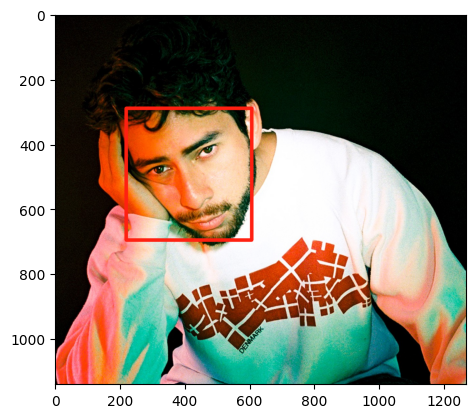

In [6]:
# Create a bounding box to see if the face is being correctly detected
x1, y1, width, height = roi[0]["box"]
x2, y2 = x1 + width, y1 + height

# Draw the box
bounded_face = cv2.rectangle(np.copy(pic), (x1, y1), (x2, y2), (255, 32, 17), 10)
plt.imshow(bounded_face);

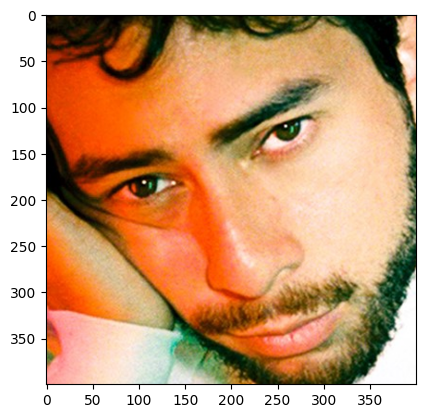

In [7]:
# This is the image we're gonna feed the model
resized = cv2.resize(pic[y1:y2, x1:x2], INPUT_SIZE, interpolation=cv2.INTER_LANCZOS4)
plt.imshow(resized);

In [8]:
# Clear memory to avoid errors
def clear_oom():
    print("Clearing the Cache and running Garbage Collection")
    gc.collect()
    tf.keras.backend.clear_session()

# Preprocess one singular image
def preprocess_image(path):
    detector = mtcnn.MTCNN()
    # Load image and detect faces
    pic = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    roi = detector.detect_faces(pic);

    # Create a new picture cropping only the face
    x1, y1, width, height = roi[0]["box"]
    x2, y2 = x1 + width, y1 + height

    return cv2.resize(pic[y1:y2, x1:x2], INPUT_SIZE, interpolation=cv2.INTER_LANCZOS4)

# Crop all the images to fit just the faces (preprocess) to all images
def classify_dataset():
    # Grants that the trash path exists
    assert_path(TRASH_PATH)
    assert_path(DATA_PATH)

    # Garbage Collection Countdown (no C compiler here for now xD)
    gcc = 0
    for _class in os.listdir(IMG_PATH):
        print(f"Class => {_class}")
        # MTCNN face detector (we reinstantiate it before every reading loop to avoid OOM errors)
        detector = mtcnn.MTCNN()
        clear_oom()
        for img in os.listdir(path_join(IMG_PATH, _class)):
            print(img)
            # Garbage collect and reinstantiate
            if gcc == 300:
                clear_oom()
                detector = mtcnn.MTCNN()
                gcc = 0

            # Load image and detect faces
            pic = cv2.cvtColor(cv2.imread(path_join(IMG_PATH, _class, img)), cv2.COLOR_BGR2RGB)
            roi = detector.detect_faces(pic)
            
            # TODO: Once the model is bootstrapped, we could detect who each person is when len > 1, thus
            # creating an even larger dataset;
            # If there are no faces or more than one, discard the image
            if not roi or len(roi) > 1:
                os.rename(path_join(IMG_PATH, _class, img), path_join(TRASH_PATH, img))
                continue

            # Create a new picture cropping only the face
            x1, y1, width, height = roi[0]["box"]
            x2, y2 = x1 + width, y1 + height
            # Resize to input into our model
            resized = cv2.resize(pic[y1:y2, x1:x2], INPUT_SIZE, interpolation=cv2.INTER_LANCZOS4)
            cv2.imwrite(path_join(DATA_PATH, _class, img), cv2.cvtColor(resized, cv2.COLOR_RGB2BGR))
            gcc += 1
    
    clear_oom()

classify_dataset()

## Data Augmentation (Second Pre-Processing)

This function will artificially create new images by applying transformations to the given image and setting its label. 

The random transformations we're gonna apply here: 

- Mirror image (left-right)
- Filters (gaussian, [min, max, mode, median] filter, blur)
- Scale Shift (Black & White, gray scale)
- Rotations

In [9]:
ALPHABET = "0123456789abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ"
FILTERS = [
    ImageFilter.GaussianBlur(2),
    ImageFilter.EDGE_ENHANCE_MORE,
    ImageFilter.ModeFilter(7),
    ImageFilter.MaxFilter(3),
    ImageFilter.MinFilter(3),
    ImageFilter.MedianFilter(5),
]
FILTERS_LEN = len(FILTERS)
assert_path(AUG_PATH)

# A random chance of the transformation occuring
def should_apply(percentage: float=0.5):
    return random.random() < percentage

# Create a new filename for an augmented image
def new_filename(name: str):
    tokens = name.split(".")
    if len(tokens) > 2: # For weird paths
        tokens = [''.join(tokens[:-1]), tokens[-1]]
    path, extension = tokens

    # Adds salt, because an image can have multiple augmented versions
    salt = ''.join(random.choice(ALPHABET) for _ in range(6))
    return f"{path}-aug-{salt}.{extension}"

# Data Augmentation 
def data_augmentation(filepath, save=True):
    # Give a random chance of not having an augmented version of the image 
    if should_apply(0.1): return 
    # And a chance of having multiple augmented versions 
    if should_apply(0.3): data_augmentation(filepath)

    img = Image.open(filepath)
    if should_apply(0.5):
        # Mirror the image on its vertical axis.
        img = ImageOps.mirror(img)
    
    if should_apply(0.4):
        # We do not want to flip it upside down, because is hard that a real image
        # will be supplied flipped. But an angled face is very common.
        angle = random.randint(-90, 90)
        img = img.rotate(angle)

    if should_apply(0.2):
        if should_apply(0.5):
            # Returns a grayscale image
            img = ImageOps.grayscale(img) 
        else: 
            # It'll create a kinda dithered B&W image
            img = img.convert('1')

    # Be sure that the image is in the right format before filters
    if img.mode != "RGB":
        img = img.convert("RGB")
    
    # Apply a random filter
    if should_apply(0.9):
        idx = random.randint(0, FILTERS_LEN)
        if idx == FILTERS_LEN:
            # Those filters don't have a dedicated class, so we do a little trolling
            if should_apply(0.5):
                img = img.effect_spread(5)
            elif should_apply(0.5):
                # Filter a # of colors from the image
                color_scale = [8, 16, 14, 32, 48, 64]
                img = img.convert('P', 
                                  palette=Image.ADAPTIVE, 
                                  colors=random.choice(color_scale))
                img = img.convert("RGB")
            else:
                # Adds some noise
                img = img.convert('P', palette=Image.BICUBIC)
                img = img.convert("RGB")
        else:
            img = img.filter(FILTERS[idx])

    if save:
        img.save(new_filename(filepath))
        return
    return img


In [10]:
# Run the data augmentation throughout the dataset 
def run_data_aug():
    # Iterate through all sub-directories to Augment every image
    for imclass in os.listdir(DATA_PATH):
        assert_path(path_join(AUG_PATH, imclass))
        for img in os.listdir(path_join(DATA_PATH, imclass)):
            data_augmentation(path_join(DATA_PATH, imclass, img))
  
run_data_aug()

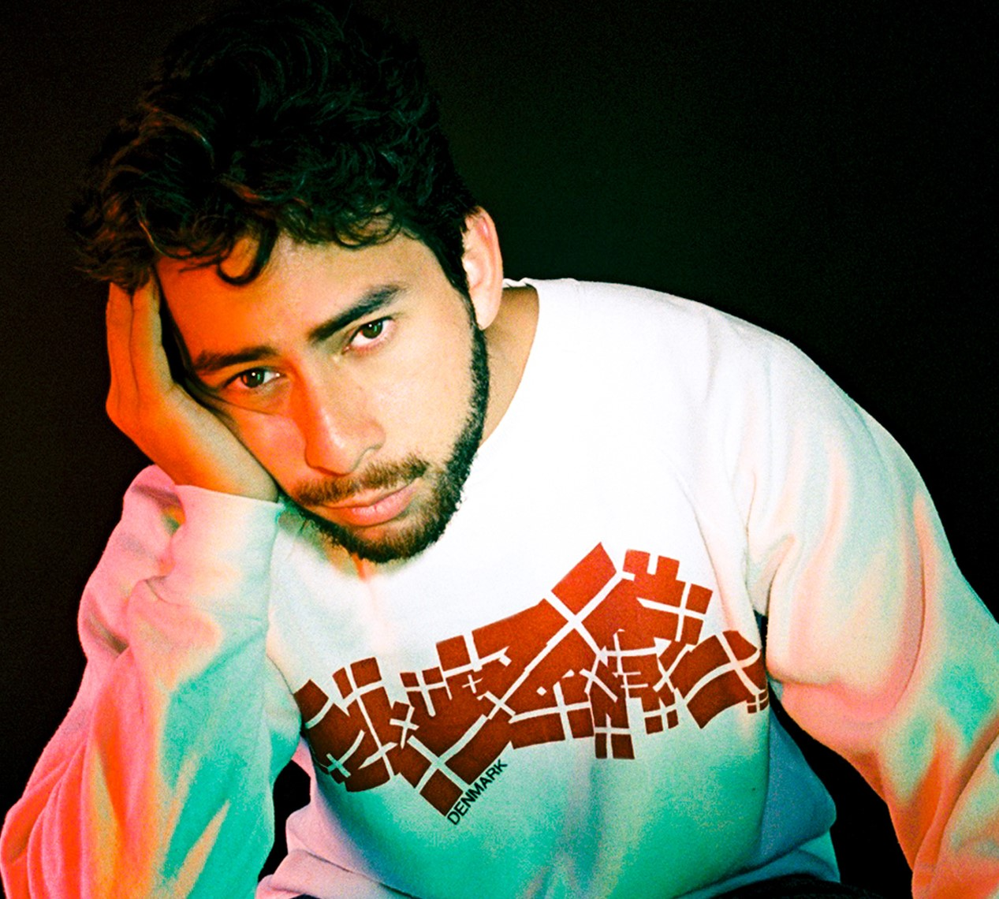

In [11]:
# Original photo
Image.open("arkpatrol.jpg")

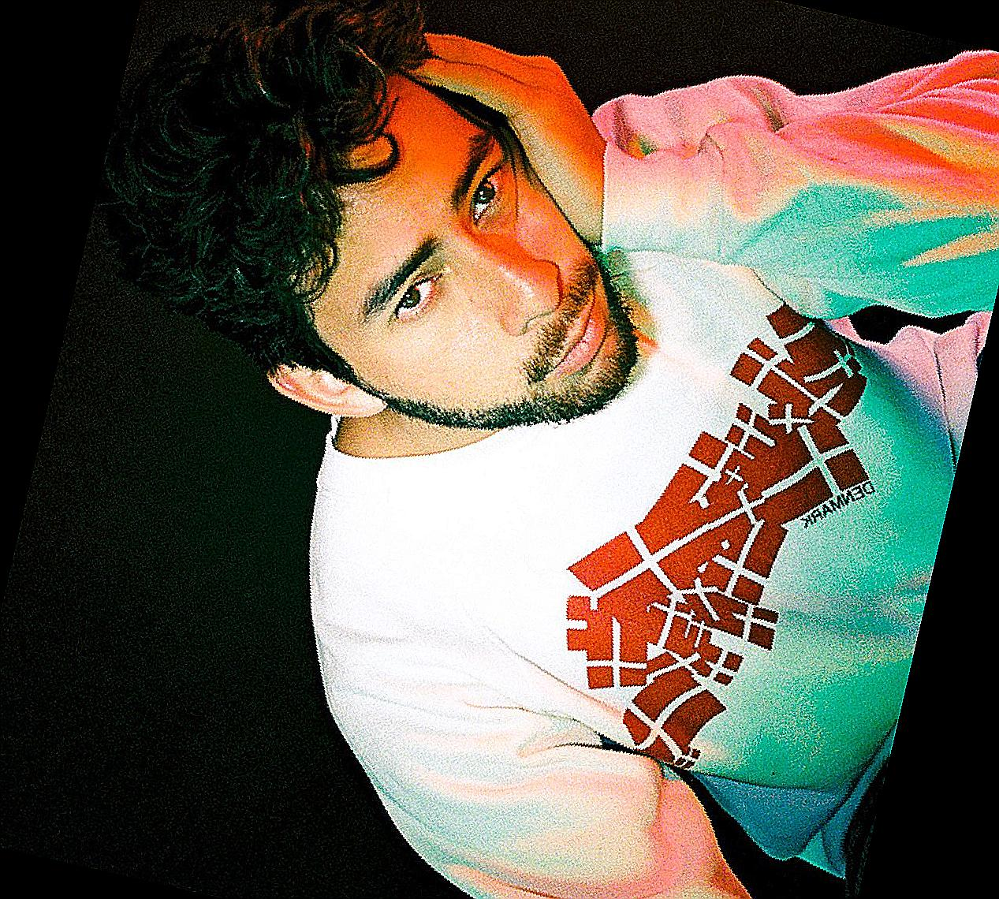

In [12]:
# Augmented image 
Image.open("arkpatrol-aug-8TBNI6.jpg")

# Apply the data augmentation (uncomment to create a new morphed image)
# data_augmentation("arkpatrol.jpg", False)

## Import Dataset

Here we create the functions to import our dataset, using the Dataset API from Tensorflow that allows us to pass a huge dataset to the model without loading everything to memory. 

In [13]:
# Move the data-augmented images in/out of the pool of images to feed the model
def move_data_aug(way="in"):
    if way == "in":
        SRC = path_join(AUG_PATH)
        DEST = path_join(DATA_PATH)
    else:
        SRC = path_join(DATA_PATH)
        DEST = path_join(AUG_PATH)

    for imclass in os.listdir(SRC):
        for img in os.listdir(path_join(SRC, imclass)):
            if "-aug-" in img:
                os.rename(path_join(SRC, imclass, img), path_join(DEST, imclass, img))

# Load the images for the training and test set
def load_images(augmented=False):
    move_data_aug(way="in") if augmented else move_data_aug(way="out")

    # Create a tensorflow dataset from the images
    train_ds = tf.keras.utils.image_dataset_from_directory(
        DATA_PATH,
        validation_split=DATA_SPLIT[-1],
        subset="training",
        seed=RAND_SEED,
        image_size=INPUT_SIZE,
        batch_size=BATCH_SIZE
    )

    test_ds = tf.keras.utils.image_dataset_from_directory(
        DATA_PATH,
        validation_split=DATA_SPLIT[-1],
        subset="validation",
        seed=RAND_SEED,
        image_size=INPUT_SIZE,
        batch_size=BATCH_SIZE
    )

    return train_ds, test_ds, train_ds.class_names

# Get N Batches of images as an numpy array
def get_n_batches(dataset, n=5):
    sx, sy = [], []
    
    for images, labels in dataset.take(n):
        for image, label in zip(images.numpy(), labels.numpy()):
            sx.append(image.astype("uint8"))
            sy.append(label)

    return np.array(sx), np.array(sy)

In [14]:
# Let's load the augmented-free version of the dataset
train_ds, test_ds, labels = load_images(augmented=False)
labels

Found 2510 files belonging to 7 classes.
Using 2008 files for training.
Found 2510 files belonging to 7 classes.
Using 502 files for validation.


['billie', 'childish', 'mars', 'taylor', 'tyler', 'weeknd', 'ye']

ye


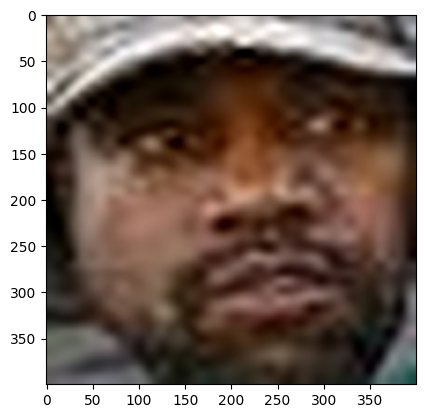

In [15]:
show_x, show_y = get_n_batches(train_ds, 2)
show = 13

print(labels[show_y[show]])
plt.imshow(show_x[show]);

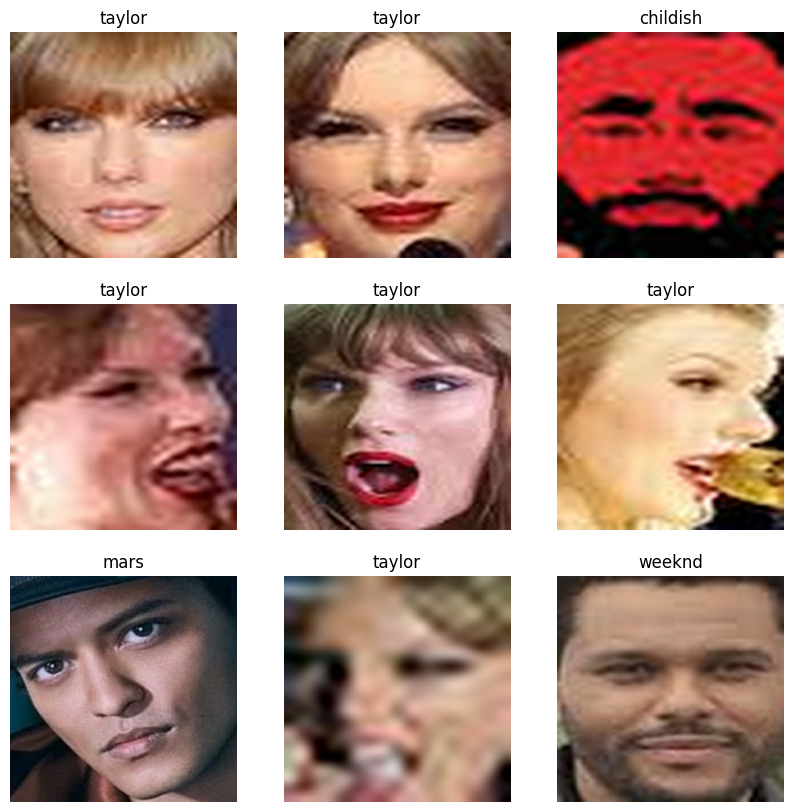

In [16]:
plt.figure(figsize=(10, 10))
for images, legend in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(labels[legend[i]])
    plt.axis("off")

## Part 1: Create the Non-Augmented Model

We first use all the images in their original states to have a ground truth to work with, to then see if an augmented version of the dataset is any better for creating a more perfomant model. 

In [17]:
def bootstrap_model():
    # Clear out any old model state.
    clear_oom()

    # Build a Similarity model using standard Keras layers
    inputs = layers.Input(shape=(INPUT_SIZE[0], INPUT_SIZE[1], 3))
    x = layers.Rescaling(1.0 / 255.0)(inputs)
    x = layers.Conv2D(32, 3, activation="relu")(x)
    x = layers.Conv2D(32, 3, activation="relu")(x)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(32, 3, activation="relu")(x)
    x = layers.Conv2D(32, 3, activation="relu")(x)
    x = layers.Flatten()(x)
    x = layers.Dense(16, activation='relu')(x)
    outputs = MetricEmbedding(32)(x)

    # Build a specialized Similarity model
    model = SimilarityModel(inputs, outputs)
    print(model.summary())
    
    losser = MultiSimilarityLoss(distance=DISTANCE)
    optimizer = tf.keras.optimizers.Adam()
    # Train Similarity model using contrastive loss
    model.compile(optimizer=optimizer, 
                  loss=losser)

    return model

unaug_model = None
if PRETRAINED:
    unaug_model = tf.keras.models.load_model("pretrained_models/unaug_facial_model",
        custom_objects={"SimilarityModel": tfsim.models.SimilarityModel}
    )
    # reload the index
    unaug_model.load_index("pretrained_models/unaug_facial_model")
else:
    unaug_model = bootstrap_model()

Clearing the Cache and running Garbage Collection
Model: "similarity_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 400, 400, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 398, 398, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 396, 396, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 198, 198, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 196, 196, 32)      9248      


In [18]:
# Train the model
if not PRETRAINED:
    fit_hist = unaug_model.fit(train_ds, validation_data=test_ds, epochs=EPOCHS)

Epoch 1/30


2024-06-18 19:29:42.398712: E tensorflow/compiler/xla/stream_executor/gpu/gpu_cudamallocasync_allocator.cc:306] gpu_async_0 cuMemAllocAsync failed to allocate 2907357184 bytes: CUDA error: out of memory (CUDA_ERROR_OUT_OF_MEMORY)
 Reported by CUDA: Free memory/Total memory: 327022986/4294836224
2024-06-18 19:29:42.398767: E tensorflow/compiler/xla/stream_executor/gpu/gpu_cudamallocasync_allocator.cc:311] Stats: Limit:                      2998298215
InUse:                      2306742754
MaxInUse:                   3300486498
NumAllocs:                        2438
MaxAllocSize:               1629591040
Reserved:                            0
PeakReserved:                        0
LargestFreeBlock:                    0

2024-06-18 19:29:42.398788: E tensorflow/compiler/xla/stream_executor/gpu/gpu_cudamallocasync_allocator.cc:63] Histogram of current allocation: (allocation_size_in_bytes, nb_allocation_of_that_sizes), ...;
2024-06-18 19:29:42.398794: E tensorflow/compiler/xla/stream_execu

63/63 [==============================] - 128s 1s/step - loss: 1.0295 - val_loss: 1.0137
Epoch 2/30
63/63 [==============================] - 65s 1s/step - loss: 1.0148 - val_loss: 1.0047
Epoch 3/30
63/63 [==============================] - 56s 865ms/step - loss: 1.0002 - val_loss: 1.0029
Epoch 4/30
63/63 [==============================] - 35s 550ms/step - loss: 0.9749 - val_loss: 0.9580
Epoch 5/30
63/63 [==============================] - 35s 551ms/step - loss: 0.9386 - val_loss: 0.9645
Epoch 6/30
63/63 [==============================] - 35s 548ms/step - loss: 0.9125 - val_loss: 0.9347
Epoch 7/30
63/63 [==============================] - 43s 682ms/step - loss: 0.8551 - val_loss: 0.9012
Epoch 8/30
63/63 [==============================] - 57s 916ms/step - loss: 0.8309 - val_loss: 0.9113
Epoch 9/30
63/63 [==============================] - 43s 682ms/step - loss: 0.7370 - val_loss: 0.8739
Epoch 10/30
63/63 [==============================] - 35s 548ms/step - loss: 0.7140 - val_loss: 0.8807
Epoch

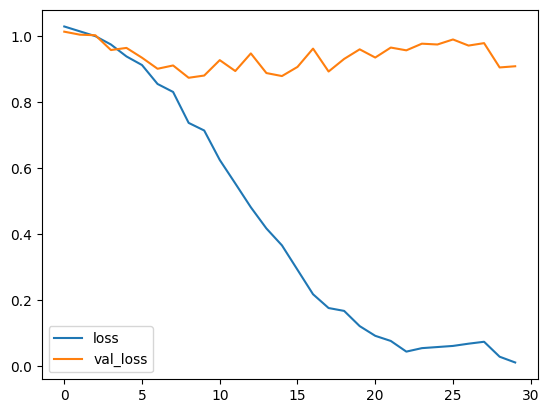

In [19]:
# Let's see how the loss in the training went down
if not PRETRAINED:
    plt.plot(fit_hist.history["loss"])
    plt.plot(fit_hist.history["val_loss"])
    plt.legend(["loss", "val_loss"])
    plt.show();

In [20]:
# Index a part of our dataset so we can query it
sx, sy = get_n_batches(test_ds, 5)

unaug_model.reset_index() # Just making sure it's empty-empty
unaug_model.index(x=sx, y=sy, data=sx)

[Indexing 32 points]
|-Computing embeddings
1/1 [==============================] - 0s 107ms/step
|-Storing data points in key value store
|-Adding embeddings to index.
|-Building index.



0%   10   20   30   40   50   60   70   80   90   100%
|----|----|----|----|----|----|----|----|----|----|
***************************************************


In [21]:
sx, sy = get_n_batches(test_ds, 20)

# Calibrate the model
calibration = unaug_model.calibrate(
    sx, sy,
    extra_metrics=["precision", "recall", "binary_accuracy"],
    verbose=1
)

1/1 [==============================] - 0s 24ms/step

Performing NN search



Evaluating: 100%|██████████| 4/4 [00:00<00:00, 308.49it/s]


 name        value    distance    precision    recall    binary_accuracy        f1
-------  --------  ----------  -----------  --------  -----------------  --------
optimal  0.769231    0.297903        0.625         1              0.625  0.769231


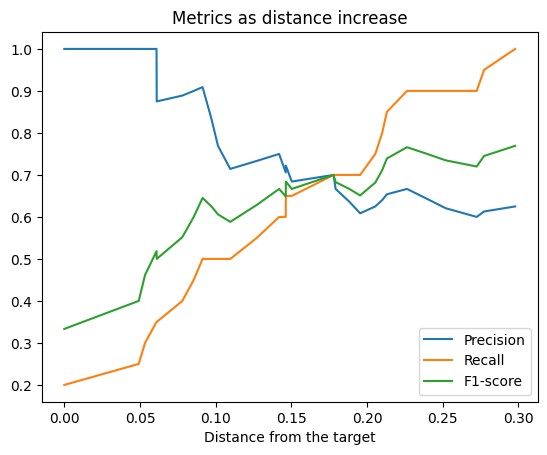

In [22]:
# Plot the precision, recall and f1-score for the observations
fig, ax = plt.subplots()
x = calibration.thresholds["distance"]
ax.plot(x, calibration.thresholds["precision"], label="Precision")
ax.plot(x, calibration.thresholds["recall"], label="Recall")
ax.plot(x, calibration.thresholds["f1"], label="F1-score")
ax.legend()
ax.set_title("Metrics as distance increase")
ax.set_xlabel("Distance from the target")
plt.show()

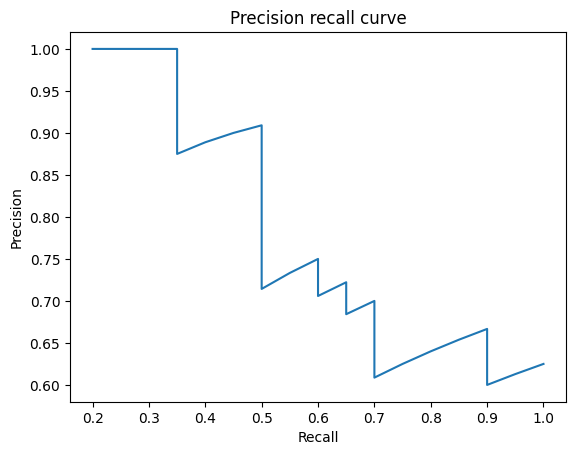

In [23]:
# Plot the recall/precision of the model as the observations are further away from each other
fig, ax = plt.subplots()
ax.plot(calibration.thresholds["recall"], calibration.thresholds["precision"])
ax.set_title("Precision recall curve")
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
plt.show()

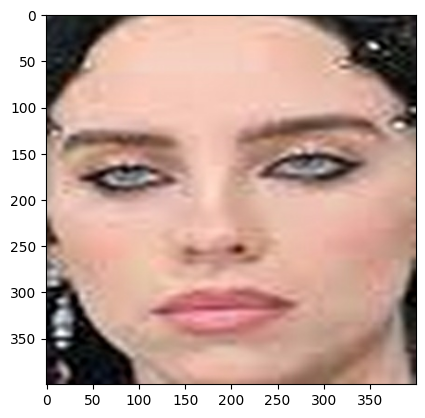

In [34]:
imgn = 10

# Get an example image to find in the indexed images
qx, qy = sx[imgn], sy[imgn] 
plt.imshow(qx);

1/1 [==============================] - 0s 62ms/step


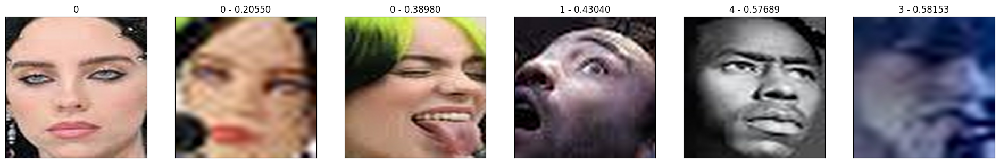

In [35]:
# Get "k" nearest neighbors
knns = unaug_model.single_lookup(qx, k=5)

# Visualize the query example and its top 5 neighbors
viz_neigbors_imgs(qx, qy, knns)

In [36]:
# Match the face to a label
pred = np.reshape(qx, (-1, INPUT_SIZE[0], INPUT_SIZE[1], 3))
match_pred = unaug_model.match(pred)[0]

# Convert the int value of the label to its name
print("Predicted:", labels[match_pred])
print("Correct Label:", labels[qy])

1/1 [==============================] - 0s 22ms/step
Predicted: billie
Correct Label: billie


1/1 [==============================] - 0s 20ms/step
taylor


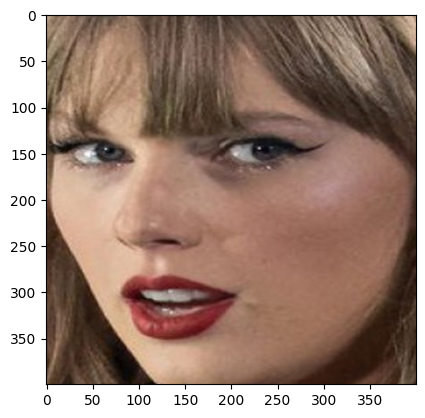

In [27]:
# Test if he guesses a new image right
test = preprocess_image("unknown_taylor.jpg")

pred = np.reshape(test, (-1, INPUT_SIZE[0], INPUT_SIZE[1], 3))
print(labels[unaug_model.match(pred)[0]])
plt.imshow(test);

In [37]:
# No idea why it only works wrapping the path on dirname(), but here we are
# Saves the model in a .h5 file to later use
unaug_model.save("saved_models/unaug_facial_model")


# Free up space from the model
del unaug_model, test_ds, train_ds, fit_hist, labels, sx, sy
# clear_oom()

## Part 2: Creating the Augmented Model

Now that we have a baseline of metrics to work with, we can train a new model using the enhanced dataset with the data augmentation to see if we have a significant jump in perfomance of the model.

In [38]:
# Let's load the original and augmented images for the second part of the experiment
train_ds, test_ds, labels = load_images(augmented=True)
labels

Found 5577 files belonging to 7 classes.
Using 4462 files for training.
Found 5577 files belonging to 7 classes.
Using 1115 files for validation.


['billie', 'childish', 'mars', 'taylor', 'tyler', 'weeknd', 'ye']

In [39]:
# Bootstrap a new model
aug_model = None

# If pretreined, we do not need to train a new model
if PRETRAINED:
    aug_model = tf.keras.models.load_model("pretrained_models/aug_facial_model",
        custom_objects={"SimilarityModel": tfsim.models.SimilarityModel}
    )
    # reload the index
    aug_model.load_index("pretrained_models/aug_facial_model")
else:
    aug_model = bootstrap_model()

Clearing the Cache and running Garbage Collection
Model: "similarity_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 400, 400, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 398, 398, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 396, 396, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 198, 198, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 196, 196, 32)      9248      


In [40]:
if not PRETRAINED:
    # Train the model
    fit_hist = aug_model.fit(train_ds, validation_data=test_ds, epochs=EPOCHS)

Epoch 1/30
140/140 [==============================] - 221s 2s/step - loss: 1.0250 - val_loss: 1.0085
Epoch 2/30
140/140 [==============================] - 207s 1s/step - loss: 1.0018 - val_loss: 0.9990
Epoch 3/30
140/140 [==============================] - 200s 1s/step - loss: 0.9795 - val_loss: 0.9780
Epoch 4/30
140/140 [==============================] - 204s 1s/step - loss: 0.9552 - val_loss: 0.9501
Epoch 5/30
140/140 [==============================] - 211s 1s/step - loss: 0.9325 - val_loss: 0.9358
Epoch 6/30


2024-06-18 20:23:53.768829: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] Filling up shuffle buffer (this may take a while): 1 of 256
2024-06-18 20:23:56.023905: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] Shuffle buffer filled.


140/140 [==============================] - 229s 2s/step - loss: 0.8972 - val_loss: 0.9475
Epoch 7/30
140/140 [==============================] - 205s 1s/step - loss: 0.8667 - val_loss: 0.9472
Epoch 8/30
140/140 [==============================] - 208s 1s/step - loss: 0.8166 - val_loss: 0.9460
Epoch 9/30
140/140 [==============================] - 206s 1s/step - loss: 0.7618 - val_loss: 0.9230
Epoch 10/30
140/140 [==============================] - 195s 1s/step - loss: 0.7080 - val_loss: 0.9423
Epoch 11/30
140/140 [==============================] - 213s 2s/step - loss: 0.6841 - val_loss: 0.9652
Epoch 12/30
140/140 [==============================] - 199s 1s/step - loss: 0.6044 - val_loss: 0.9341
Epoch 13/30
140/140 [==============================] - 197s 1s/step - loss: 0.5169 - val_loss: 0.9303
Epoch 14/30
140/140 [==============================] - 195s 1s/step - loss: 0.4503 - val_loss: 0.9419
Epoch 15/30
140/140 [==============================] - 196s 1s/step - loss: 0.3613 - val_loss: 0.

In [41]:
# Index a part of our dataset so we can query it
sx, sy = get_n_batches(test_ds, 5)

aug_model.reset_index() # Just making sure it's empty-empty
aug_model.index(x=sx, y=sy, data=sx)

[Indexing 32 points]
|-Computing embeddings
1/1 [==============================] - 1s 597ms/step
|-Storing data points in key value store
|-Adding embeddings to index.
|-Building index.



0%   10   20   30   40   50   60   70   80   90   100%
|----|----|----|----|----|----|----|----|----|----|
***************************************************


In [42]:
sx, sy = get_n_batches(test_ds, 20)

# Calibrate the model
calibration = aug_model.calibrate(
    sx, sy,
    extra_metrics=["precision", "recall", "binary_accuracy"],
    verbose=1
)

1/1 [==============================] - 0s 25ms/step

Performing NN search



Evaluating: 100%|██████████| 4/4 [00:00<00:00, 157.49it/s]


 name        value    distance    precision    recall    binary_accuracy        f1
-------  --------  ----------  -----------  --------  -----------------  --------
optimal  0.888889    0.204463     0.869565  0.909091              0.625  0.888889


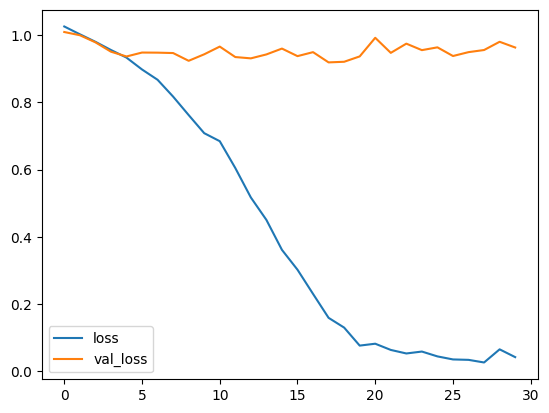

In [43]:
if not PRETRAINED:
    # Let's see how the loss in the training went down
    plt.plot(fit_hist.history["loss"])
    plt.plot(fit_hist.history["val_loss"])
    plt.legend(["loss", "val_loss"])
    plt.show();

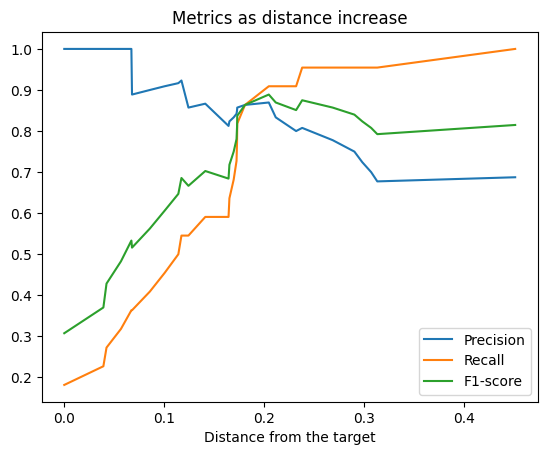

In [44]:
# Plot the precision, recall and f1-score for the observations
fig, ax = plt.subplots()
x = calibration.thresholds["distance"]
ax.plot(x, calibration.thresholds["precision"], label="Precision")
ax.plot(x, calibration.thresholds["recall"], label="Recall")
ax.plot(x, calibration.thresholds["f1"], label="F1-score")
ax.legend()
ax.set_title("Metrics as distance increase")
ax.set_xlabel("Distance from the target")
plt.show()

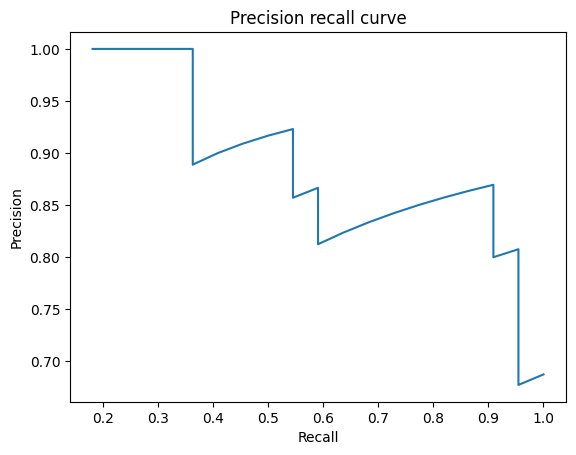

In [45]:
# Plot the recall/precision of the model as the observations are further away from each other
fig, ax = plt.subplots()
ax.plot(calibration.thresholds["recall"], calibration.thresholds["precision"])
ax.set_title("Precision recall curve")
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
plt.show()

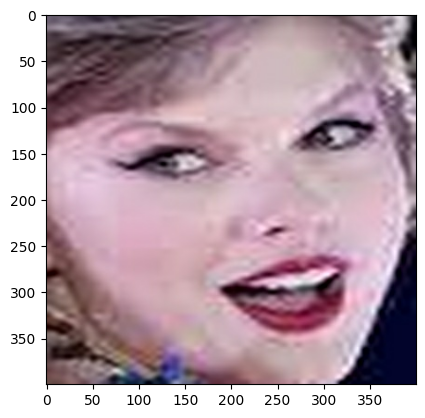

In [46]:
imgn = 13

# Get an example image to find in the indexed images
qx, qy = sx[imgn], sy[imgn] 
plt.imshow(qx);

1/1 [==============================] - 0s 149ms/step


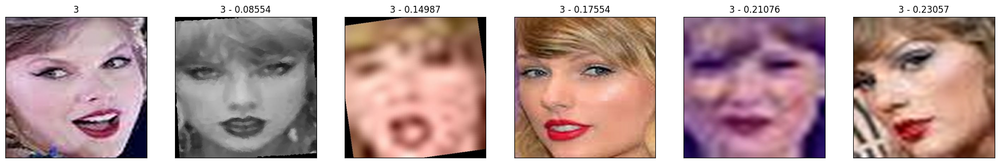

In [47]:
# Get "k" nearest neighbors
knns = aug_model.single_lookup(qx, k=5)

# Visualize the query example and its top 5 neighbors
viz_neigbors_imgs(qx, qy, knns)

In [48]:
# Match the face to a label
pred = np.reshape(qx, (-1, INPUT_SIZE[0], INPUT_SIZE[1], 3))
match_pred = aug_model.match(pred)[0]

# Convert the int value of the label to its name
print("Predicted:", labels[match_pred])
print("Correct Label:", labels[qy])

1/1 [==============================] - 0s 20ms/step
Predicted: taylor
Correct Label: taylor


1/1 [==============================] - 0s 20ms/step
ye


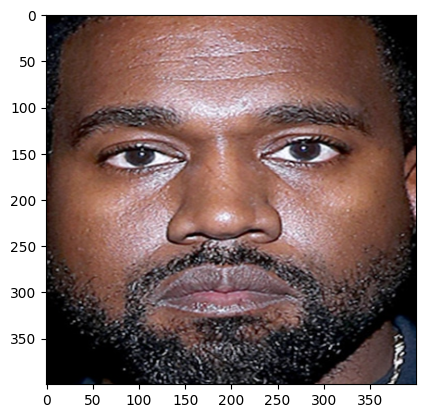

In [49]:
# Test if he guesses a new image right
test = preprocess_image("unknown_ye.jpg")
pred = np.reshape(test, (-1, INPUT_SIZE[0], INPUT_SIZE[1], 3))
print(labels[aug_model.match(pred)[0]]) # We expect "ye"

plt.imshow(test);

In [50]:
# Saves the model for later use
aug_model.save("saved_models/aug_facial_model")

INFO:tensorflow:Assets written to: saved_models/aug_facial_model/assets


INFO:tensorflow:Assets written to: saved_models/aug_facial_model/assets
